# **Практическая работа №4. Построение сверточной нейронной сети для классификации изображений, с использованием BatchNormalization() и Dropout()**

## **Задание 1. Построение сверточной нейронной сети для классификации изображений из датасета CIFAR-100, с использованием BatchNormalization() и Dropout():**



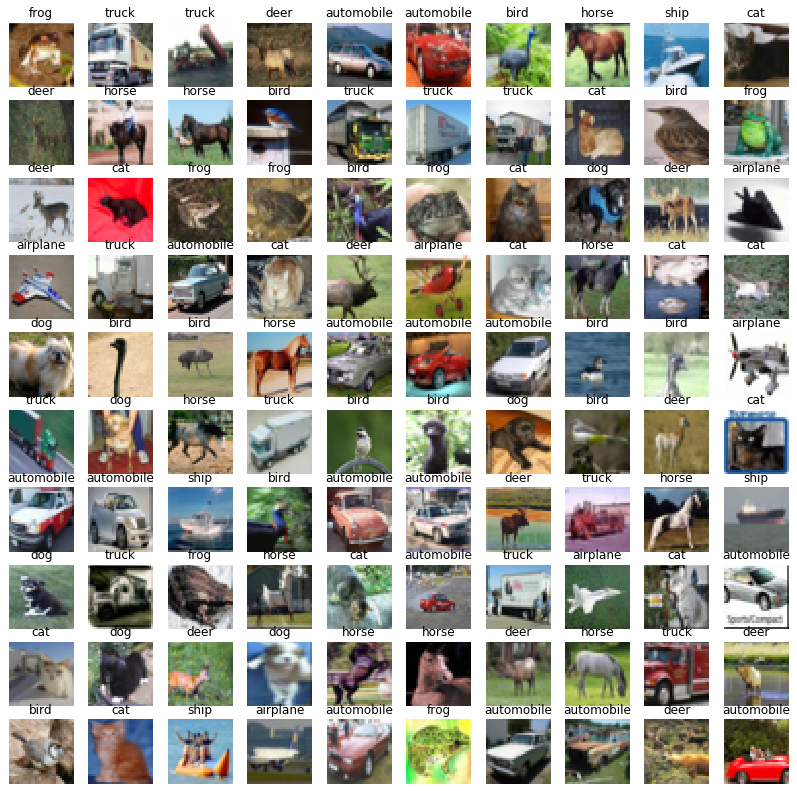

### **1.1. Загрузите исходный датасет. Разделите его на обучающую и тестовую выборки:**



*P.S.: Не забудьте обратить внимание на размерность (shape) исходных данных и при необходимости измените её (см. примеры из предыдущих занятий)*

[Информация о датасете](https://www.cs.toronto.edu/%7Ekriz/cifar.html)

[Техническая документация по использованию датасета в Keras](https://www.tensorflow.org/api_docs/python/tf/keras/datasets/cifar100/load_data)





In [1]:
# Ваш код #
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Activation, BatchNormalization, Conv2D, Dense,
    Dropout, Flatten, MaxPooling2D
)
from tensorflow.keras.datasets import cifar100
from tensorflow.keras.utils import to_categorical

(x_train, y_train), (x_test, y_test) = cifar100.load_data()

print('Train: X = ', x_train.shape)
print('Test: X = ', x_test.shape)
print('Train: Y = ', y_train.shape)
print('Test: Y = ', y_test.shape)


169001437/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Train: X =  (50000, 32, 32, 3)
Test: X =  (10000, 32, 32, 3)
Train: Y =  (50000, 1)
Test: Y =  (10000, 1)


### **1.2. Визуализируйте несколько изображений из датасета:**


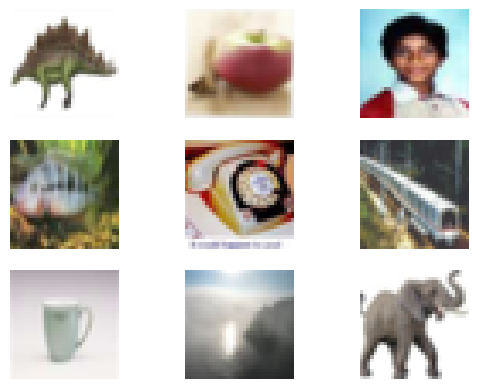

In [2]:
# Ваш код #
for i in range(1, 10):
    plt.subplot(3, 3, i)
    plt.imshow(x_train[i])
    plt.axis('off')

plt.show()

### **1.3. Произведите нормализацию данных:**

In [3]:
# Ваш код #
# нормализация
x_train = x_train / 255.0
x_test = x_test / 255.0

# изменение формы меток
y_train = y_train.flatten()
y_test = y_test.flatten()

# one-hot encoding
y_train = to_categorical(y_train, 100)
y_test = to_categorical(y_test, 100)

print('Train: X = ', x_train.shape)
print('Test: X = ', x_test.shape)
print('Train: Y = ', y_train.shape)
print('Test: Y = ', y_test.shape)

Train: X =  (50000, 32, 32, 3)
Test: X =  (10000, 32, 32, 3)
Train: Y =  (50000, 100)
Test: Y =  (10000, 100)


### **1.4. Создайте модель сверточной нейронной сети для решения поставленной задачи без использования BatchNormalization() и Dropout():**

Имя данной модели: model_1

In [4]:
# Ваш код #
model_1 = Sequential([
    Conv2D(32, (3, 3), padding='same', activation="relu", input_shape=(32, 32, 3)),
    Conv2D(32, (3, 3), padding='same', activation="relu"),
    MaxPooling2D((2, 2)),

    Conv2D(64, (3, 3), padding='same', activation="relu"),
    Conv2D(64, (3, 3), padding='same', activation="relu"),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), padding='same', activation="relu"),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(128, activation="relu"),
    Dense(100, activation="softmax")
])

model_1.summary()
model_1.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        12,900 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 414,596 (1.58 MB)

 Trainable params: 414,596 (1.58 MB)

 Non-trainable params: 0 (0.00 B)

Обучите созданную модель

In [5]:
# Ваш код #
batch_size = 128
epochs = 10

model_1_history = model_1.fit(
    x_train, y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(x_test, y_test),
    verbose=1
)

Epoch 1/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - accuracy: 0.0884 - loss: 4.0049 - val_accuracy: 0.1727 - val_loss: 3.5098
Epoch 2/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.2187 - loss: 3.2311 - val_accuracy: 0.2782 - val_loss: 2.9578
Epoch 3/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.3073 - loss: 2.7614 - val_accuracy: 0.3265 - val_loss: 2.7037
Epoch 4/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3756 - loss: 2.4343 - val_accuracy: 0.3663 - val_loss: 2.5114
Epoch 5/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.4287 - loss: 2.1910 - val_accuracy: 0.3903 - val_loss: 2.4109
Epoch 6/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.4769 - loss: 1.9739 - val_accuracy: 0.4023 - val_loss: 2.3441
Epoch 7/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5111 - loss: 1.8000 - val_accuracy: 0.4053 - val_loss: 2.3589
Epoch 8/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5511 - loss: 1.6376 - val_acc

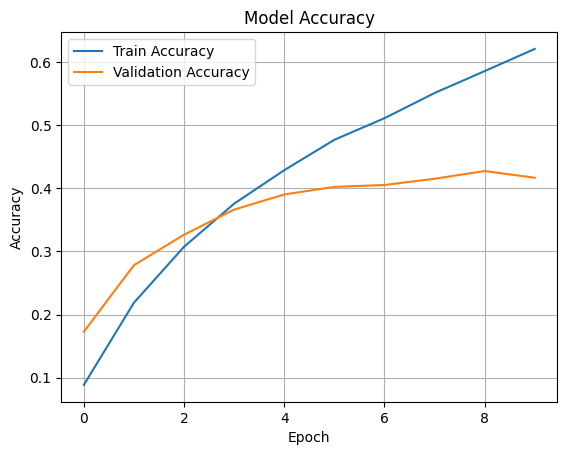

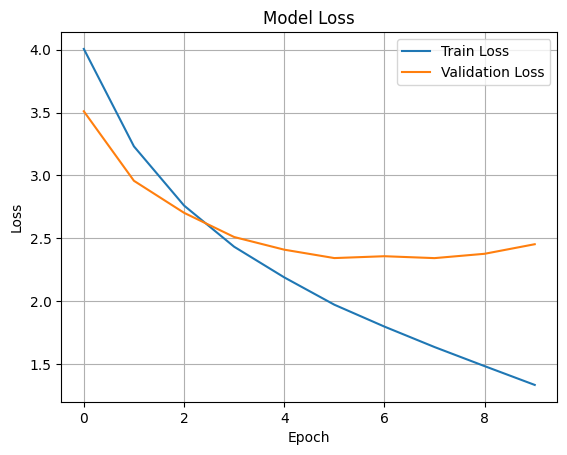

In [6]:
history = model_1_history.history

# Accuracy
plt.figure()
plt.plot(history['accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()

# Loss
plt.figure()
plt.plot(history['loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

plt.show()

### **1.5. Создайте модель сверточной нейронной сети для решения поставленной задачи с использованием BatchNormalization():**

Имя данной модели: model_2

In [7]:
# Ваш код #
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Activation

model_2 = Sequential([
    Conv2D(32, (3, 3), padding='same', input_shape=(32, 32, 3)),
    BatchNormalization(),
    Activation('relu'),
    Conv2D(32, (3, 3), padding='same'),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2, 2)),

    Conv2D(64, (3, 3), padding='same'),
    BatchNormalization(),
    Activation('relu'),
    Conv2D(64, (3, 3), padding='same'),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), padding='same'),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2, 2)),

    Flatten(),

    Dense(128),
    BatchNormalization(),
    Activation('relu'),

    Dense(100, activation='softmax')
])
model_2.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

Обучите созданную модель

In [8]:
# Ваш код #
batch_size = 128
epochs = 10

model_2_history = model_2.fit(
    x_train, y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(x_test, y_test),
    verbose=1
)

Epoch 1/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - accuracy: 0.2197 - loss: 3.3319 - val_accuracy: 0.0847 - val_loss: 4.4195
Epoch 2/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.3977 - loss: 2.3646 - val_accuracy: 0.2703 - val_loss: 3.1083
Epoch 3/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.4900 - loss: 1.9286 - val_accuracy: 0.4003 - val_loss: 2.3661
Epoch 4/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.5610 - loss: 1.6288 - val_accuracy: 0.4240 - val_loss: 2.2518
Epoch 5/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6220 - loss: 1.3768 - val_accuracy: 0.4426 - val_loss: 2.2073
Epoch 6/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6797 - loss: 1.1501 - val_accuracy: 0.4261 - val_loss: 2.3696
Epoch 7/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7348 - loss: 0.9428 - val_accuracy: 0.4343 - val_loss: 2.3483
Epoch 8/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7911 - loss: 0.7454 - val_acc

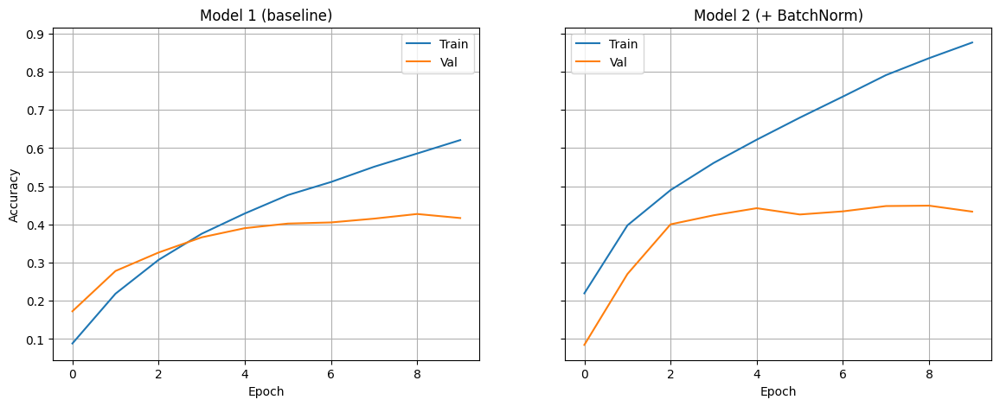

In [9]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# Model 1
ax1.plot(model_1_history.history['accuracy'], label='Train')
ax1.plot(model_1_history.history['val_accuracy'], label='Val')
ax1.set_title('Model 1 (baseline)')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True)

# Model 2
ax2.plot(model_2_history.history['accuracy'], label='Train')
ax2.plot(model_2_history.history['val_accuracy'], label='Val')
ax2.set_title('Model 2 (+ BatchNorm)')
ax2.set_xlabel('Epoch')
ax2.legend()
ax2.grid(True)

plt.show()

### **1.6. Создайте модель сверточной нейронной сети для решения поставленной задачи с использованием Dropout():**

Имя данной модели: model_3

In [10]:
# Ваш код #
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

model_3 = Sequential([
    Conv2D(32, (3, 3), padding='same', input_shape=(32, 32, 3)),
    BatchNormalization(),
    Conv2D(32, (3, 3), padding='same', activation="relu"),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Conv2D(64, (3, 3), padding='same'),
    BatchNormalization(),
    Conv2D(64, (3, 3), padding='same', activation="relu"),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Conv2D(128, (3, 3), padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.3),

    Flatten(),

    Dense(128, activation="relu"),
    Dropout(0.5),

    Dense(100, activation="softmax")
])

model_3.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

Обучите созданную модель

In [11]:
# Ваш код #
batch_size = 128
epochs = 50

model_3_history = model_3.fit(
    x_train, y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(x_test, y_test),
    verbose=1
)

Epoch 1/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - accuracy: 0.0183 - loss: 4.5369 - val_accuracy: 0.0333 - val_loss: 4.3646
Epoch 2/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0270 - loss: 4.3800 - val_accuracy: 0.0438 - val_loss: 4.3253
Epoch 3/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0326 - loss: 4.3021 - val_accuracy: 0.0656 - val_loss: 4.0347
Epoch 4/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0396 - loss: 4.2457 - val_accuracy: 0.0797 - val_loss: 3.9722
Epoch 5/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0490 - loss: 4.1590 - val_accuracy: 0.1081 - val_loss: 3.8336
Epoch 6/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0662 - loss: 4.0452 - val_accuracy: 0.1390 - val_loss: 3.6336
Epoch 7/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0905 - loss: 3.8972 - val_accuracy: 0.1656 - val_loss: 3.5378
Epoch 8/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.1170 - loss: 3.7358 - val_acc

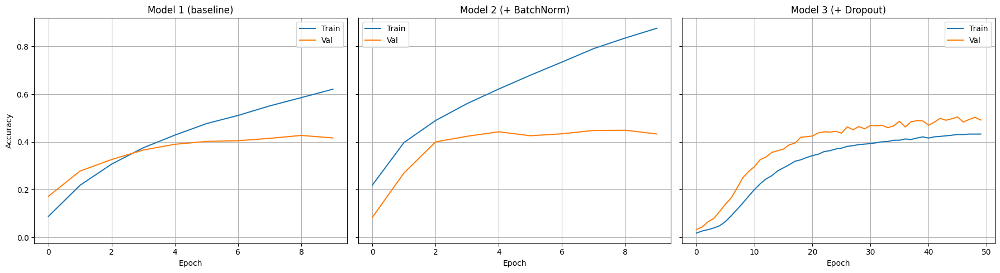

In [12]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Model 1
ax1.plot(model_1_history.history['accuracy'], label='Train')
ax1.plot(model_1_history.history['val_accuracy'], label='Val')
ax1.set_title('Model 1 (baseline)')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True)

# Model 2
ax2.plot(model_2_history.history['accuracy'], label='Train')
ax2.plot(model_2_history.history['val_accuracy'], label='Val')
ax2.set_title('Model 2 (+ BatchNorm)')
ax2.set_xlabel('Epoch')
ax2.legend()
ax2.grid(True)

# Model 3
ax3.plot(model_3_history.history['accuracy'], label='Train')
ax3.plot(model_3_history.history['val_accuracy'], label='Val')
ax3.set_title('Model 3 (+ Dropout)')
ax3.set_xlabel('Epoch')
ax3.legend()
ax3.grid(True)

plt.tight_layout()
plt.show()

### **1.7. Создайте модель сверточной нейронной сети для решения поставленной задачи с использованием Dropout() и BatchNormalization().**

См. рекомендации [здесь](https://stackoverflow.com/questions/39691902/ordering-of-batch-normalization-and-dropout) и [здесь](https://www.kaggle.com/code/ryanholbrook/dropout-and-batch-normalization/)

Имя данной модели: model_4

In [16]:
# Ваш код #
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

model_4 = Sequential([
    Conv2D(32, (3, 3), padding='same', input_shape=(32, 32, 3)),
    BatchNormalization(),
    Conv2D(32, (3, 3), padding='same', activation='relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Conv2D(64, (3, 3), padding='same'),
    BatchNormalization(),
    Conv2D(64, (3, 3), padding='same', activation='relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Conv2D(128, (3, 3), padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.3),

    Flatten(),

    Dense(128, activation='relu'),
    Dropout(0.5),

    Dense(100, activation='softmax')
])

model_4.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

Обучите созданную модель

In [17]:
# Ваш код #
batch_size = 128
epochs = 50

model_4_history = model_4.fit(
    x_train, y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(x_test, y_test),
    verbose=1
)

Epoch 1/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - accuracy: 0.0180 - loss: 4.5352 - val_accuracy: 0.0414 - val_loss: 4.4450
Epoch 2/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0279 - loss: 4.3682 - val_accuracy: 0.0605 - val_loss: 4.0747
Epoch 3/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0354 - loss: 4.2702 - val_accuracy: 0.0569 - val_loss: 4.1257
Epoch 4/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0430 - loss: 4.1939 - val_accuracy: 0.0847 - val_loss: 3.9617
Epoch 5/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0491 - loss: 4.1382 - val_accuracy: 0.0832 - val_loss: 3.9224
Epoch 6/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.0653 - loss: 4.0362 - val_accuracy: 0.1337 - val_loss: 3.6525
Epoch 7/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.0847 - loss: 3.9124 - val_accuracy: 0.1709 - val_loss: 3.4544
Epoch 8/50
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.1105 - loss: 3.7606 - val_acc

### **Задание 1.8. Пойстройте график обучения для каждой модели. Сделайте выводы по каждому из них. Подведите итог и выделите наиболее удачную модель:**

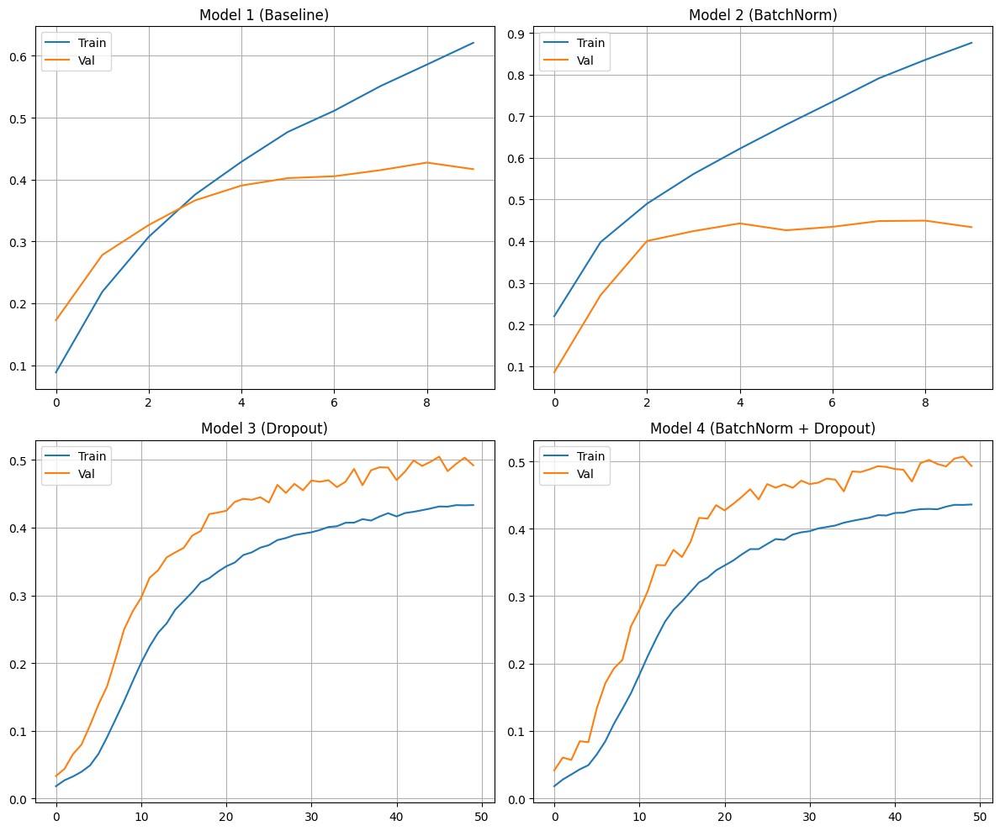

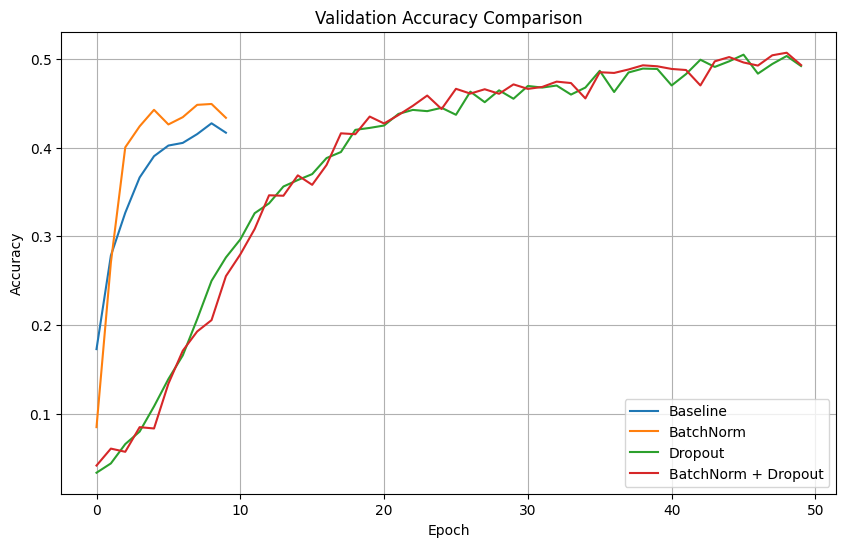

In [20]:
# Ваш код #
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Model 1
axes[0, 0].plot(model_1_history.history['accuracy'], label='Train')
axes[0, 0].plot(model_1_history.history['val_accuracy'], label='Val')
axes[0, 0].set_title('Model 1 (Baseline)')
axes[0, 0].legend()
axes[0, 0].grid()

# Model 2
axes[0, 1].plot(model_2_history.history['accuracy'], label='Train')
axes[0, 1].plot(model_2_history.history['val_accuracy'], label='Val')
axes[0, 1].set_title('Model 2 (BatchNorm)')
axes[0, 1].legend()
axes[0, 1].grid()

# Model 3
axes[1, 0].plot(model_3_history.history['accuracy'], label='Train')
axes[1, 0].plot(model_3_history.history['val_accuracy'], label='Val')
axes[1, 0].set_title('Model 3 (Dropout)')
axes[1, 0].legend()
axes[1, 0].grid()

# Model 4
axes[1, 1].plot(model_4_history.history['accuracy'], label='Train')
axes[1, 1].plot(model_4_history.history['val_accuracy'], label='Val')
axes[1, 1].set_title('Model 4 (BatchNorm + Dropout)')
axes[1, 1].legend()
axes[1, 1].grid()

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 6))

plt.plot(model_1_history.history['val_accuracy'], label='Baseline')
plt.plot(model_2_history.history['val_accuracy'], label='BatchNorm')
plt.plot(model_3_history.history['val_accuracy'], label='Dropout')
plt.plot(model_4_history.history['val_accuracy'], label='BatchNorm + Dropout')

plt.title('Validation Accuracy Comparison')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()

plt.show()

Ваши выводы

Базовая модель демонстрирует переобучение: точность на обучающей выборке значительно выше, чем на валидационной.

Batch Normalization ускоряет обучение и повышает точность, однако полностью проблему переобучения не устраняет.

Dropout снижает переобучение и улучшает обобщающую способность модели, что проявляется в более высокой точности на валидационной выборке.

Комбинирование Batch Normalization и Dropout обеспечивает наилучший результат: модель обучается стабильно и демонстрирует максимальную точность на тестовых данных.

Ваш итог

Наиболее удачной является модель с использованием Batch Normalization и Dropout, так как она обеспечивает наилучший баланс между скоростью обучения и обобщающей способностью.

### **1.9. Визуализируйте карты активации модели с BatchNorm() и Dropout(),отдельно по 5 классам (на Ваш выбор):**

In [29]:
print(y_train.shape)

(50000, 100)



 Class 0 


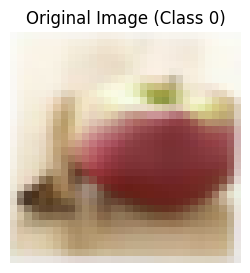

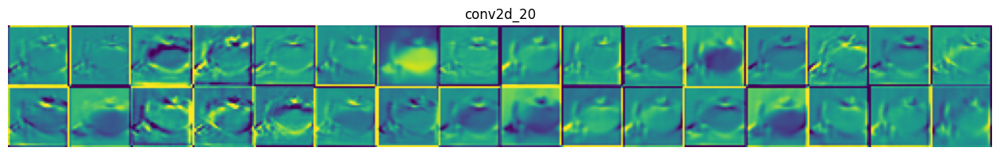

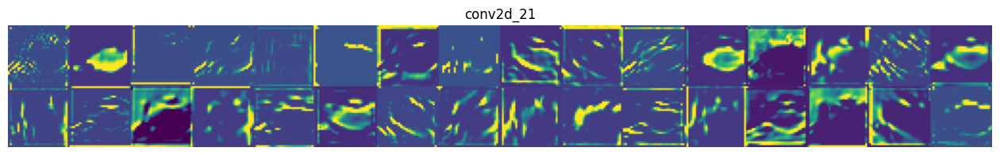

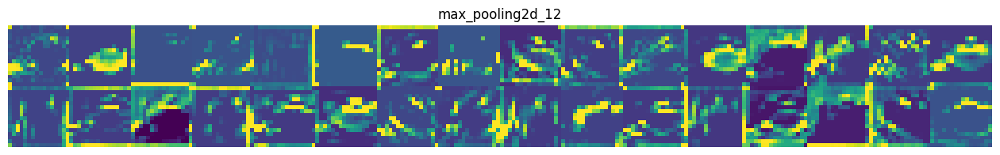

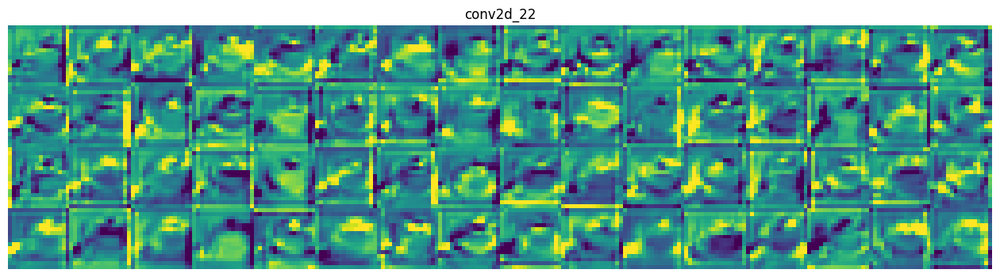

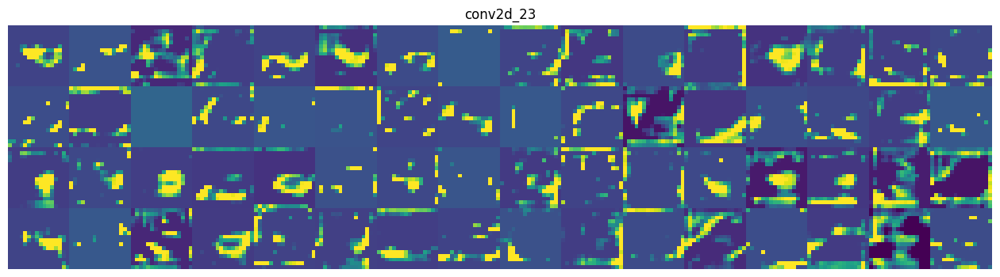

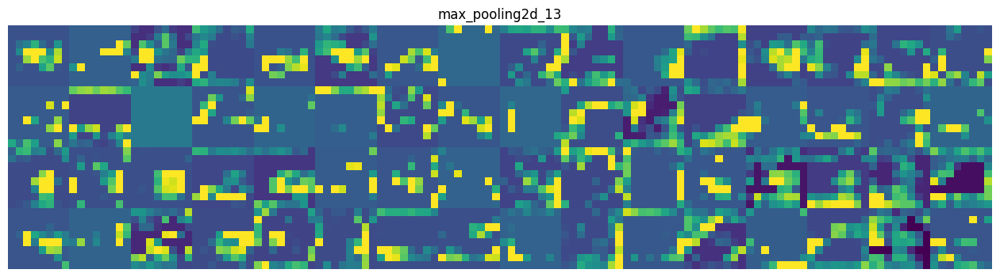

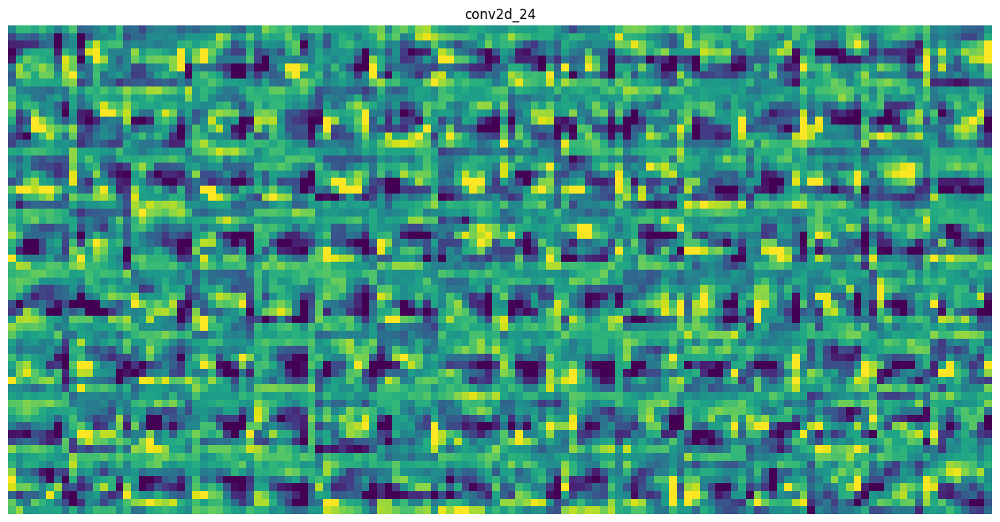

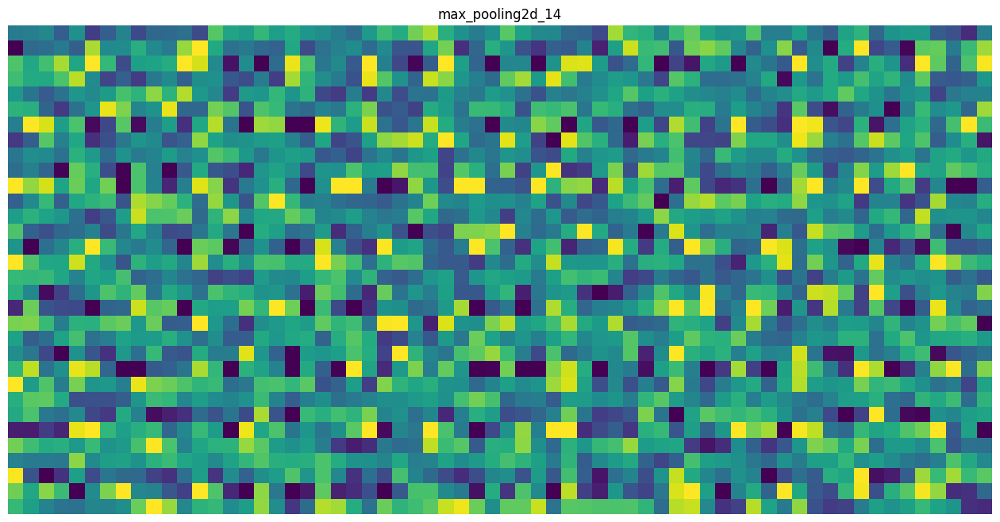


 Class 1 


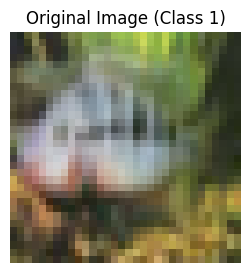

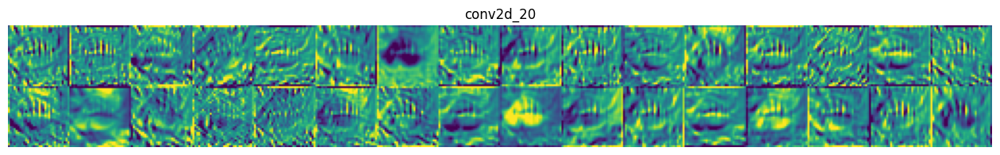

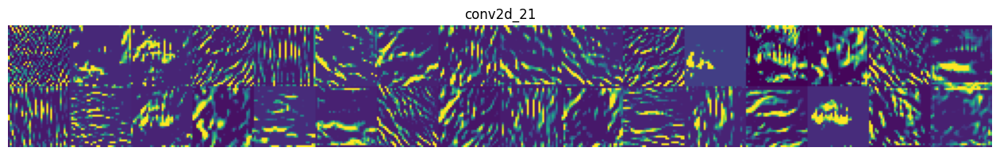

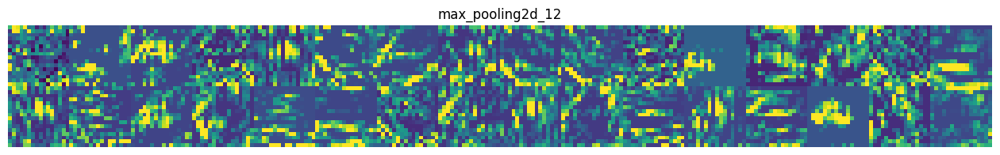

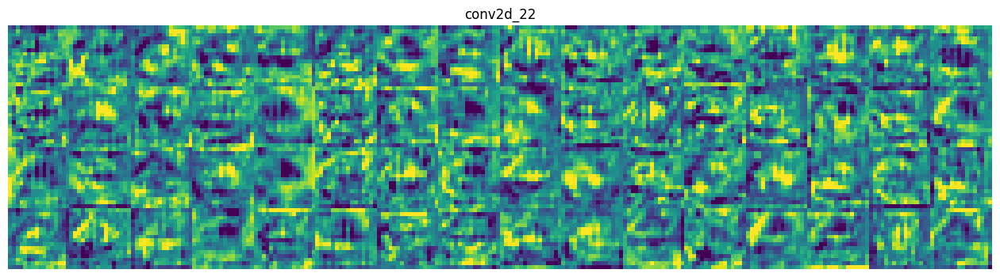

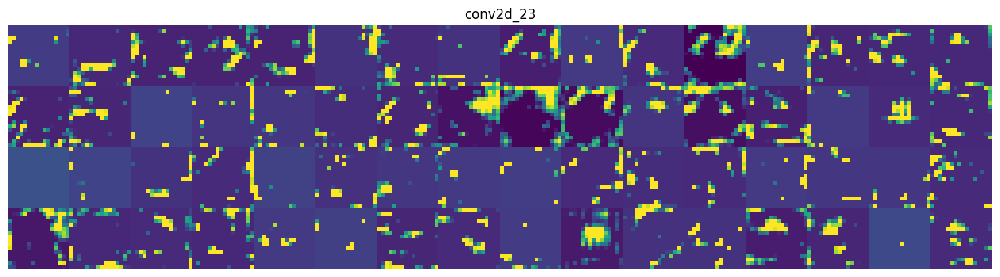

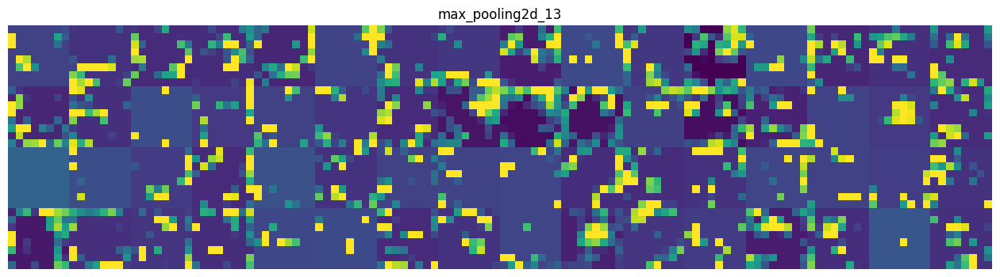

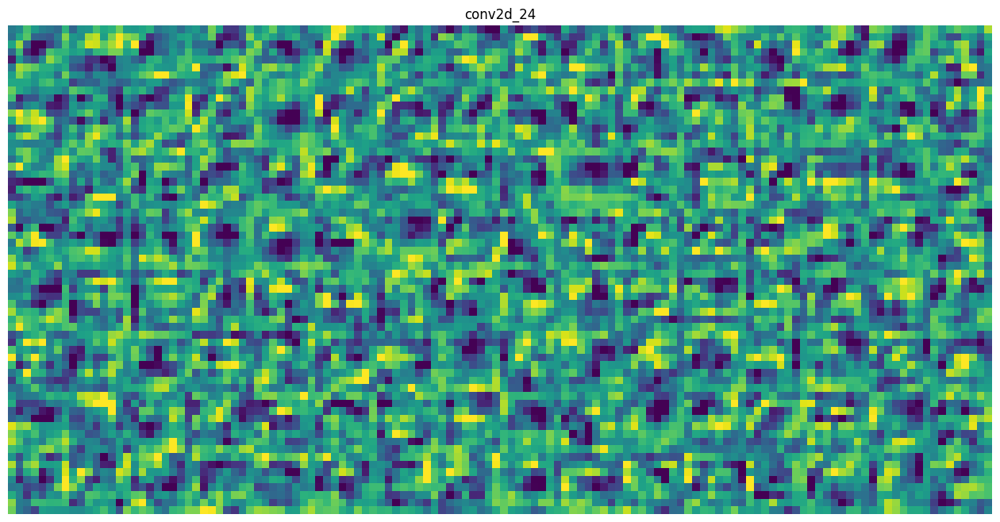

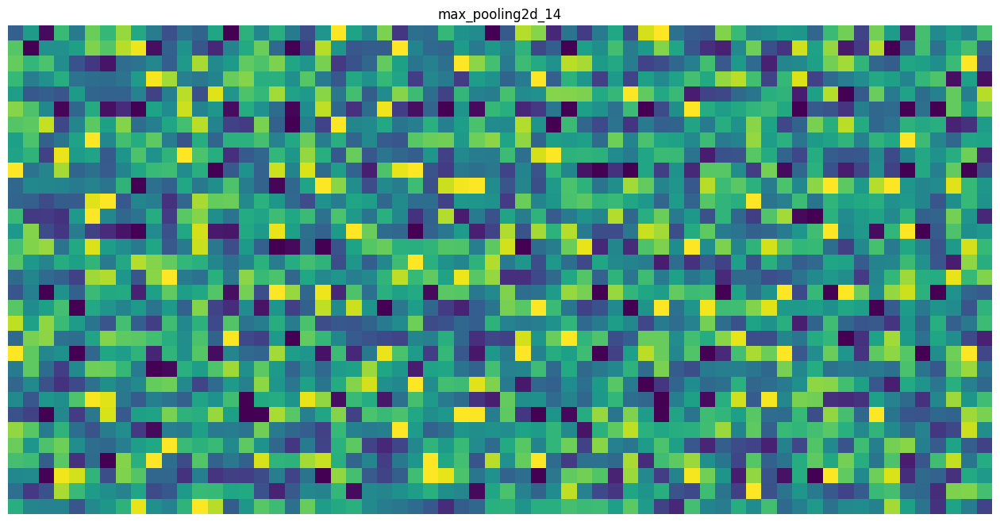


 Class 2 


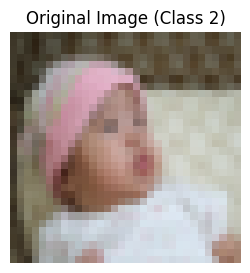

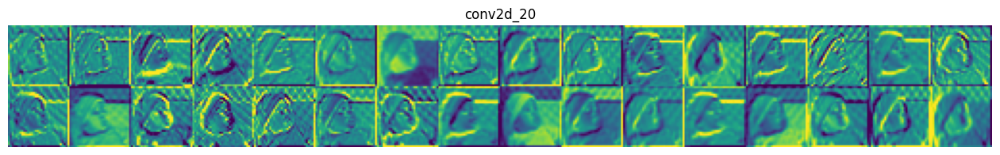

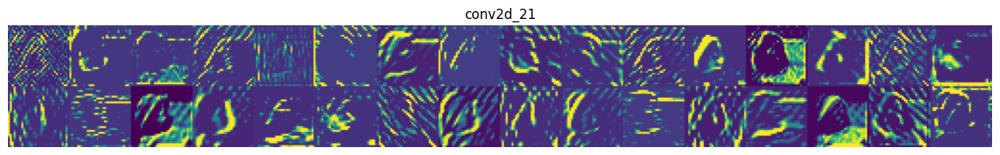

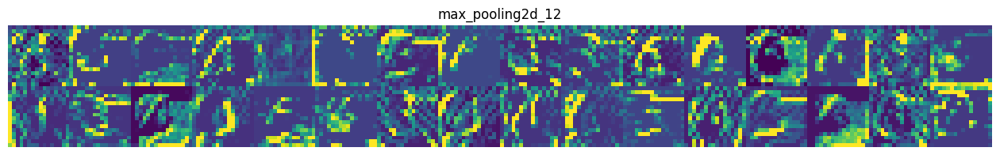

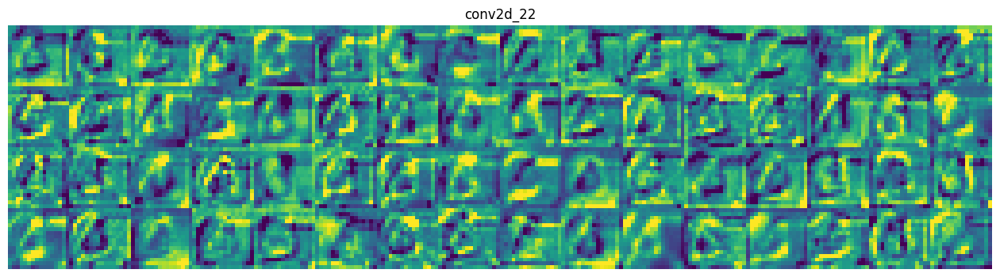

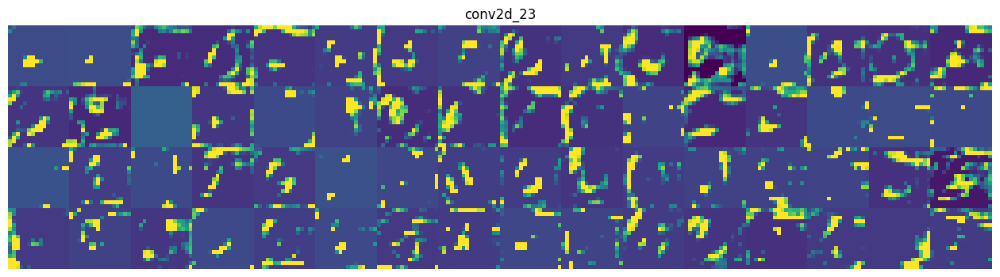

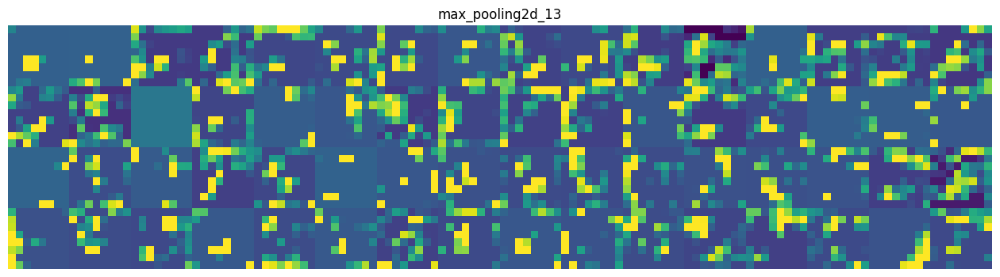

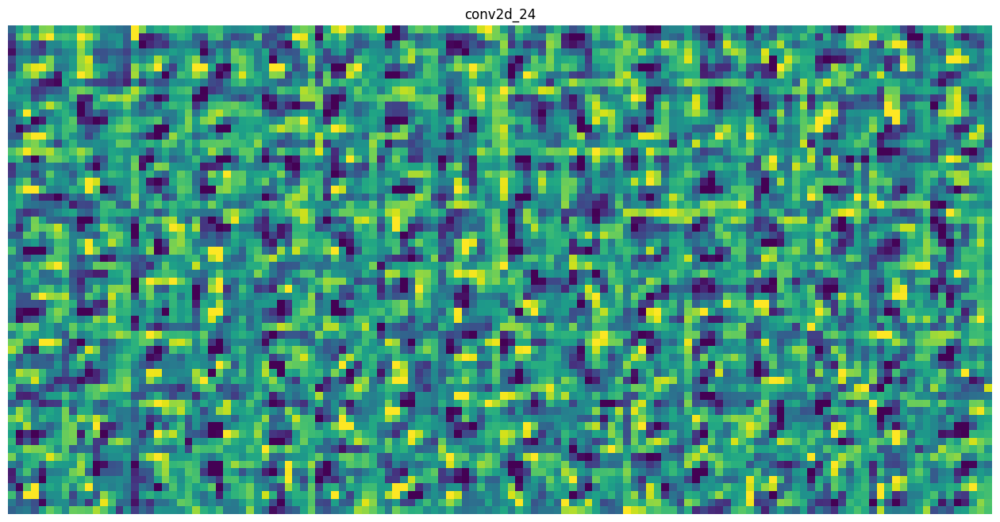

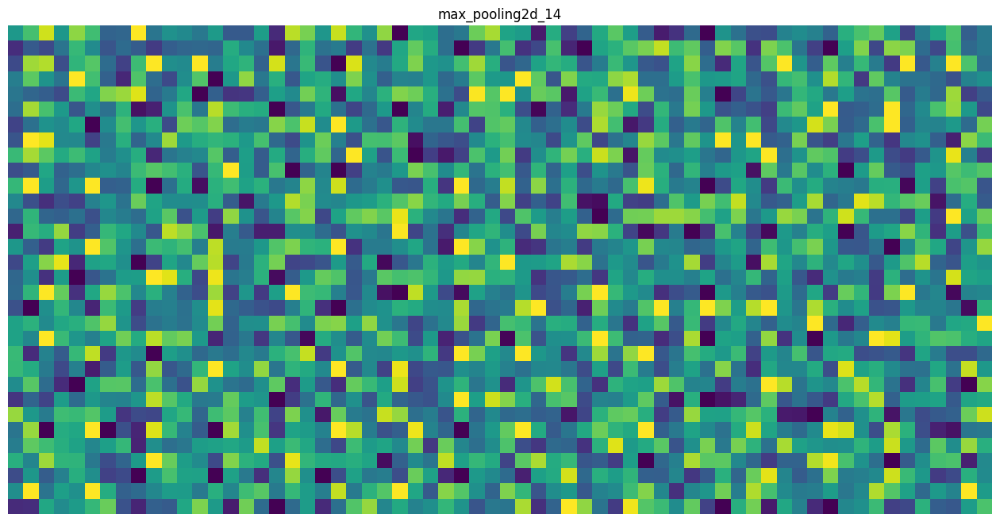


 Class 3 


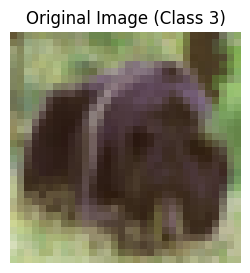

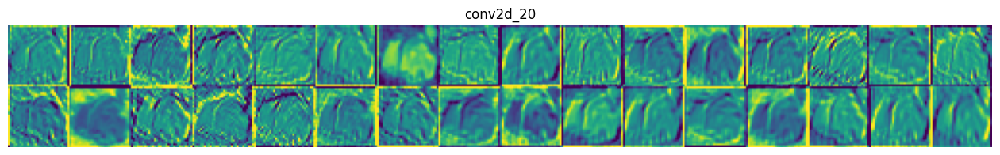

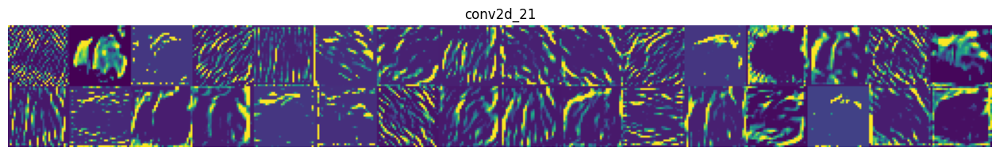

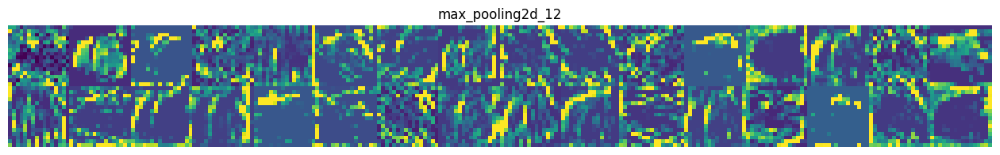

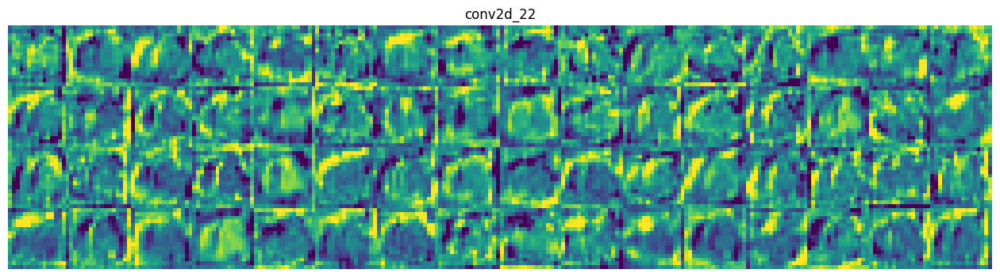

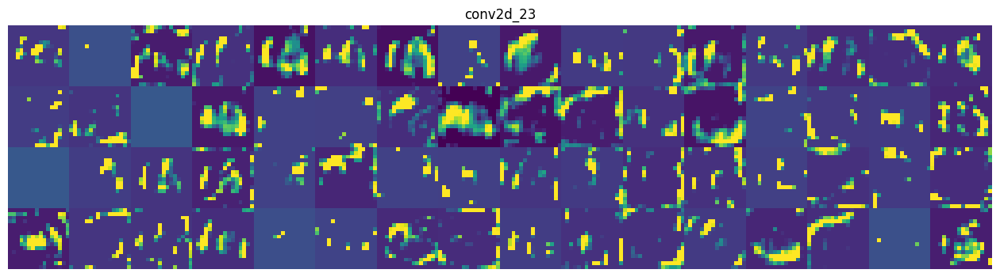

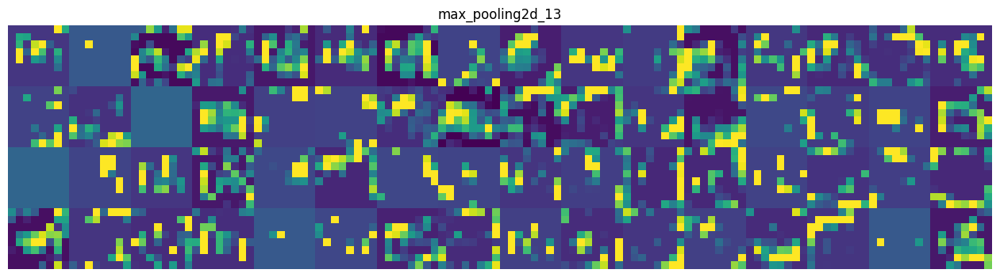

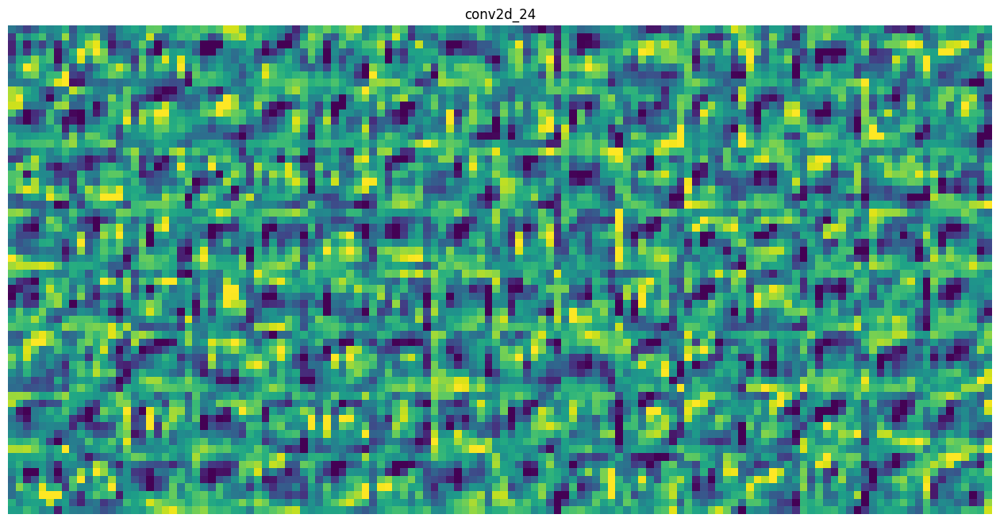

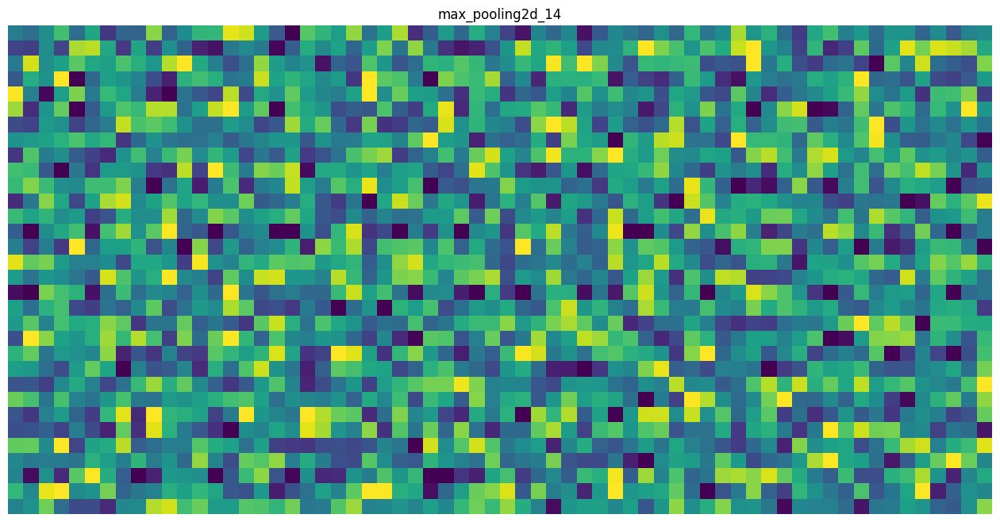


 Class 4 


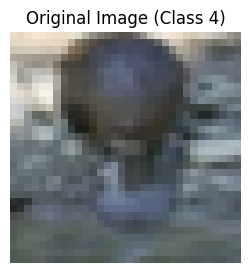

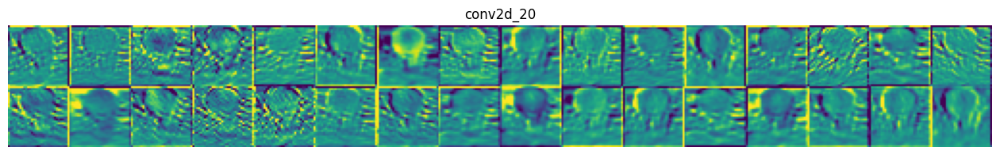

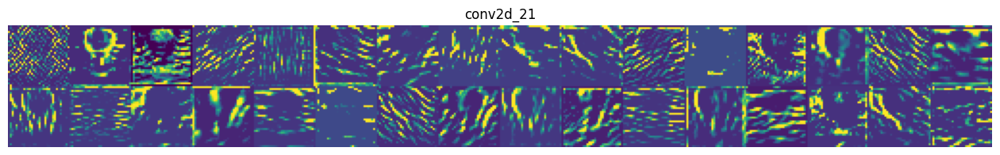

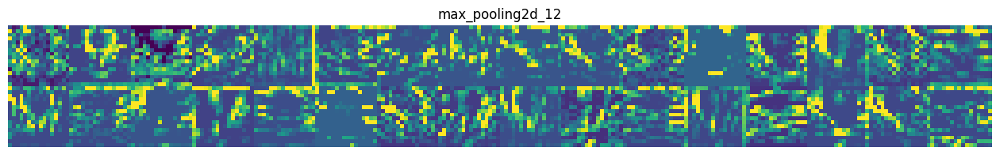

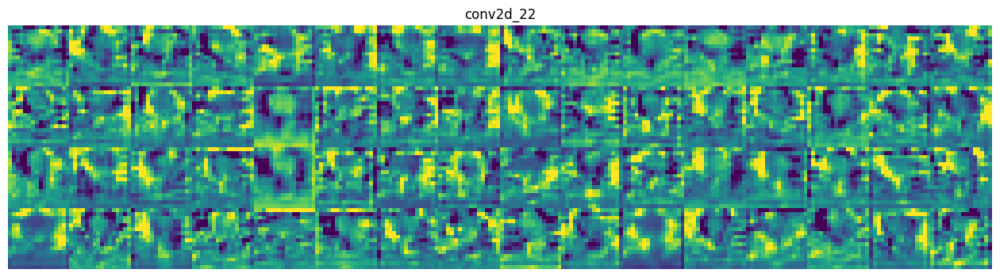

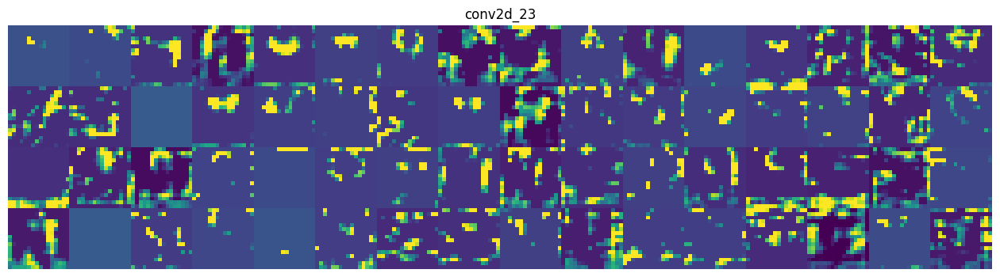

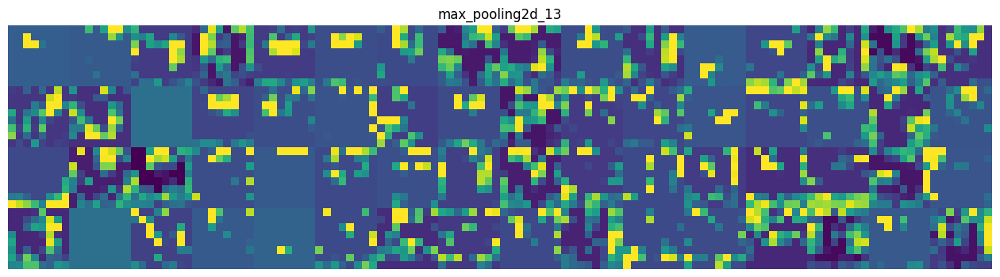

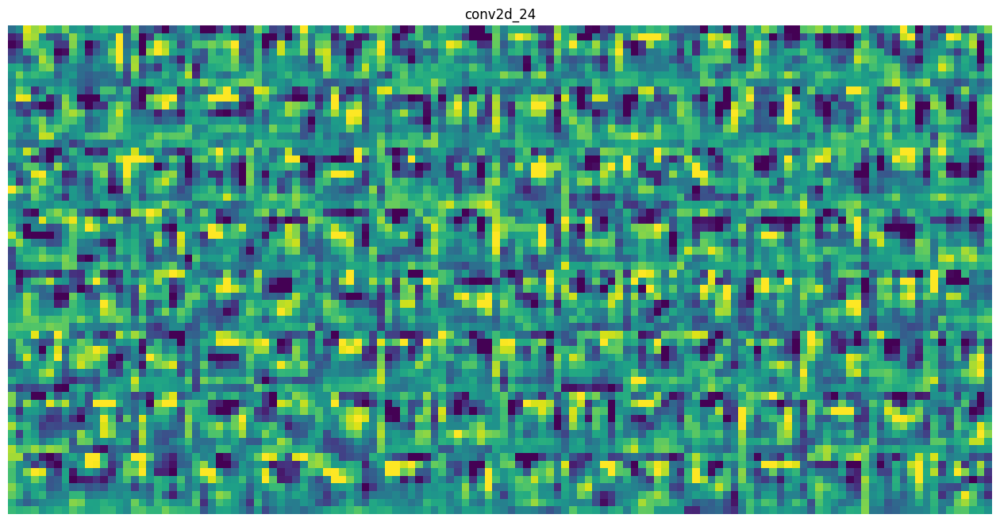

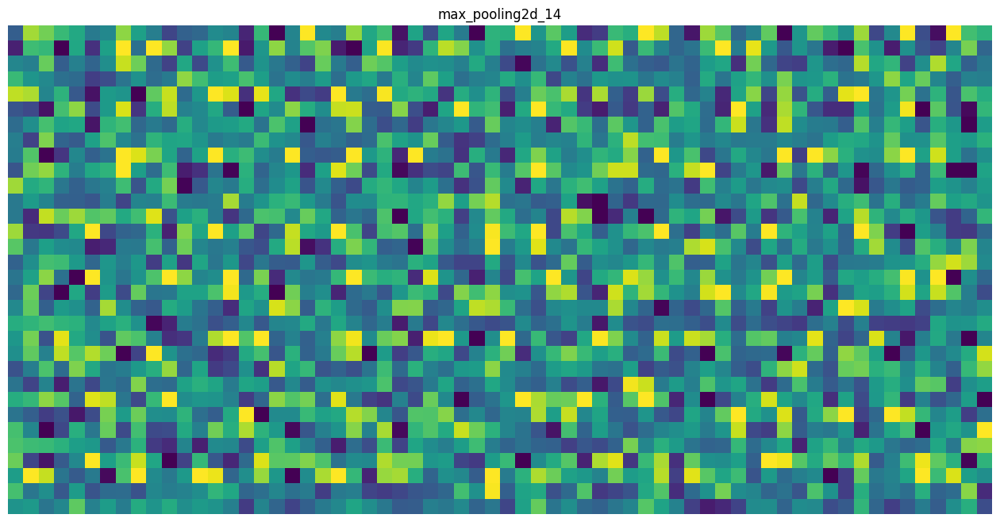

In [31]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

def visualize_act_map(model, img):
    target_types = (tf.keras.layers.Conv2D,
                    tf.keras.layers.MaxPooling2D,
                    tf.keras.layers.AveragePooling2D)

    target_names = []
    activations = []

    x = np.expand_dims(img, axis=0)

    for layer in model.layers:
        x = layer(x)
        if isinstance(layer, target_types):
            target_names.append(layer.name)
            activations.append(x.numpy() if hasattr(x, 'numpy') else np.array(x))

    if not activations:
        print("Нет подходящих слоёв.")
        return

    for layer_name, layer_activation in zip(target_names, activations):
        n_features = layer_activation.shape[-1]
        size = layer_activation.shape[1]
        n_cols = n_features // 16 + int(n_features % 16 > 0)
        display_grid = np.zeros((size * n_cols, size * 16))

        for col in range(n_cols):
            for row in range(16):
                idx = col * 16 + row
                if idx >= n_features:
                    continue

                channel_image = layer_activation[0, :, :, idx].copy()
                channel_image -= channel_image.mean()
                std = channel_image.std()

                if std != 0:
                    channel_image /= std

                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')

                display_grid[col * size:(col + 1) * size,
                             row * size:(row + 1) * size] = channel_image

        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))

        plt.title(layer_name)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.axis('off')
        plt.show()

y_train_labels = np.argmax(y_train, axis=1)

unique_classes = np.unique(y_train_labels)
classes = unique_classes[:5]

for cls in classes:
    indices = np.where(y_train_labels == cls)[0]

    if len(indices) == 0:
        continue

    idx = indices[0]
    img = x_train[idx]

    print(f"\n Class {cls} ")

    plt.figure(figsize=(3, 3))
    plt.imshow(img)
    plt.title(f'Original Image (Class {cls})')
    plt.axis('off')
    plt.show()

    visualize_act_map(model_4, img)

## **Задание 2. Загрузите Ваш датасет из предыдущей работы. Разделите его на обучающую и тестовую выборки. Обучите модель классификации с применением BatchNorm() и Dropout(). Сравните точность с моделями, обученными Вами ранее. Визуализируйте карты активаций.**

In [32]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Классы: ['Asian Green Bee-Eater', 'Brown-Headed Barbet', 'Common Kingfisher']
Train: (2217, 128, 128, 3)
Test: (555, 128, 128, 3)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_41 (Conv2D)              │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (None, 126, 126, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 63, 63, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 63, 63, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 61, 61, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_45 (Conv2D)              │ (None, 30, 30, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 30, 30, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 15, 15, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 15, 15, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 128)            │     3,686,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,827,235 (14.60 MB)

 Trainable params: 3,826,787 (14.60 MB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - accuracy: 0.5990 - loss: 2.8362 - val_accuracy: 0.3333 - val_loss: 5.2088
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7294 - loss: 0.6720 - val_accuracy: 0.3333 - val_loss: 12.0596
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.7979 - loss: 0.5309 - val_accuracy: 0.3333 - val_loss: 13.1197
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8227 - loss: 0.4476 - val_accuracy: 0.3333 - val_loss: 11.6331
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8327 - loss: 0.4381 - val_accuracy: 0.4216 - val_loss: 14.6366
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.8367 - loss: 0.4088 - val_accuracy: 0.6072 - val_loss: 4.4196
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.8647 - loss: 0.3619 - val_accuracy: 0.6234 - val_loss: 3.7578
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.8954 - loss: 0.2796 - val_accuracy: 0.77

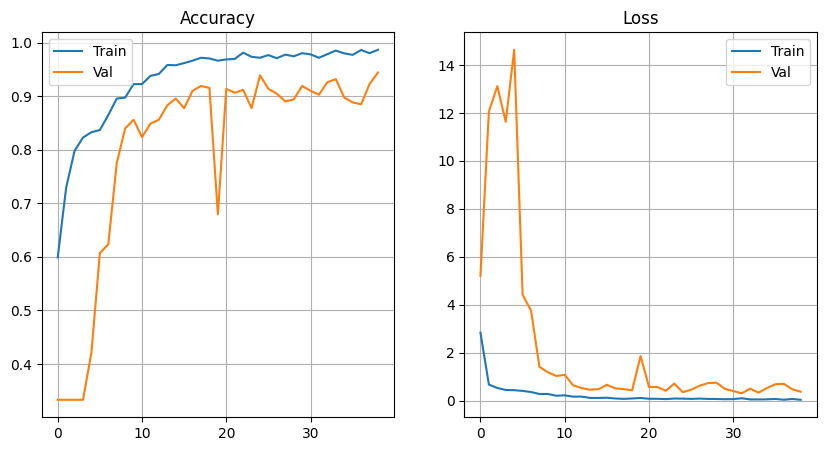


=== Class 0 ===


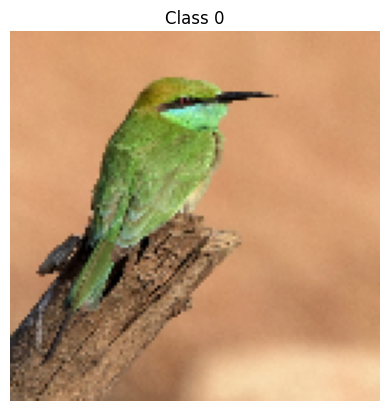

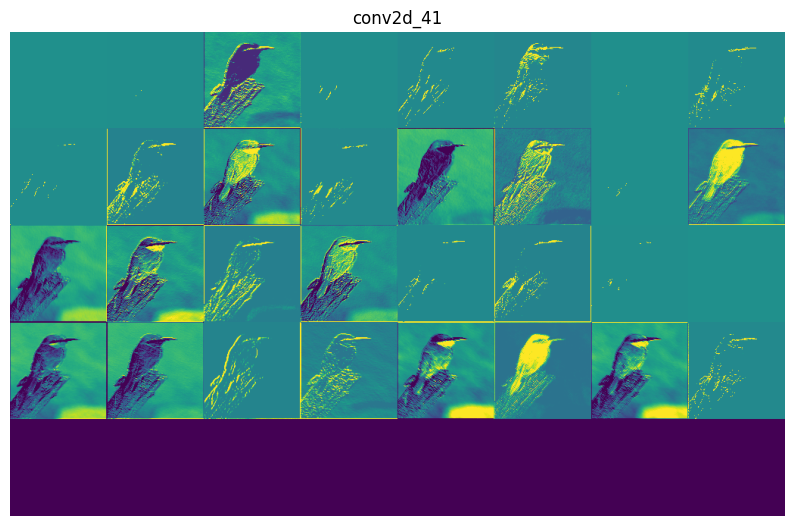

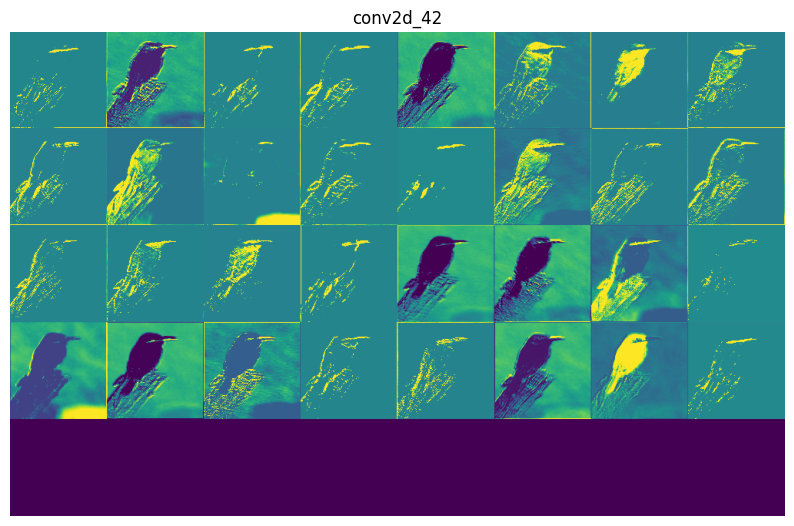

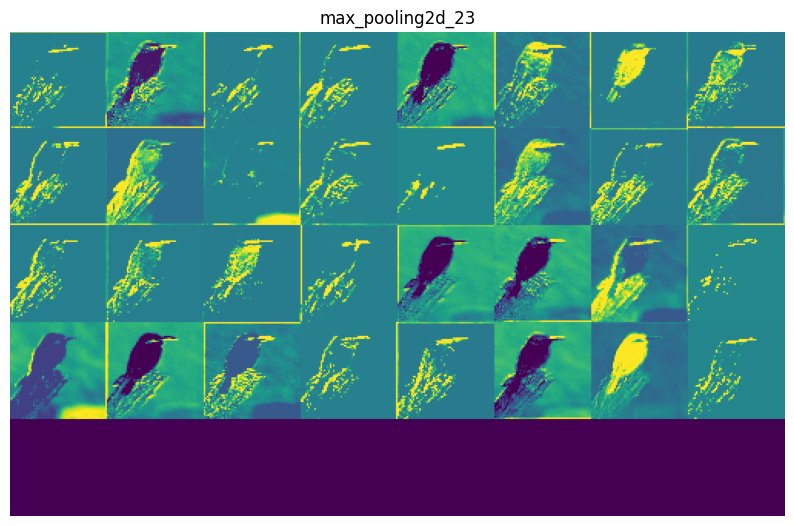

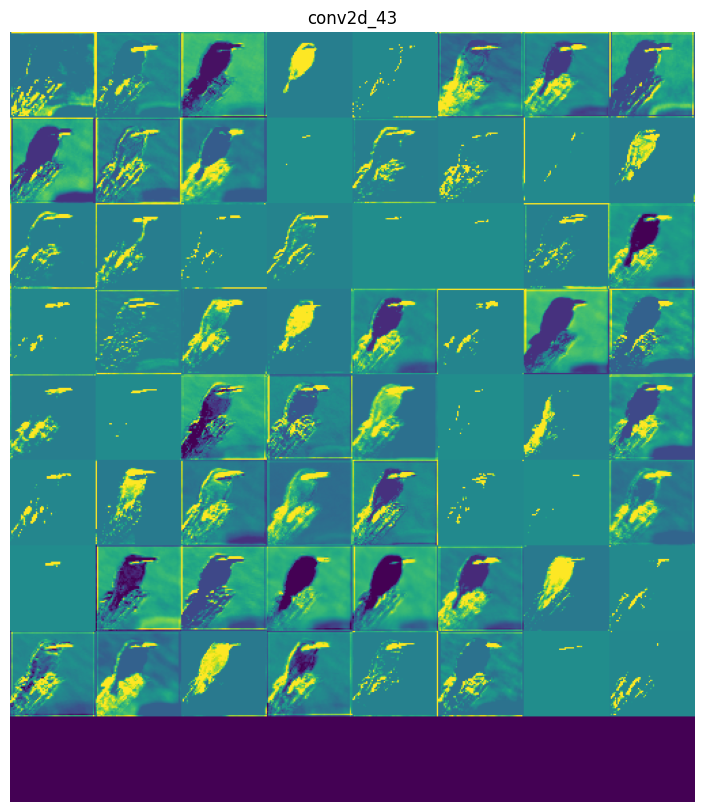

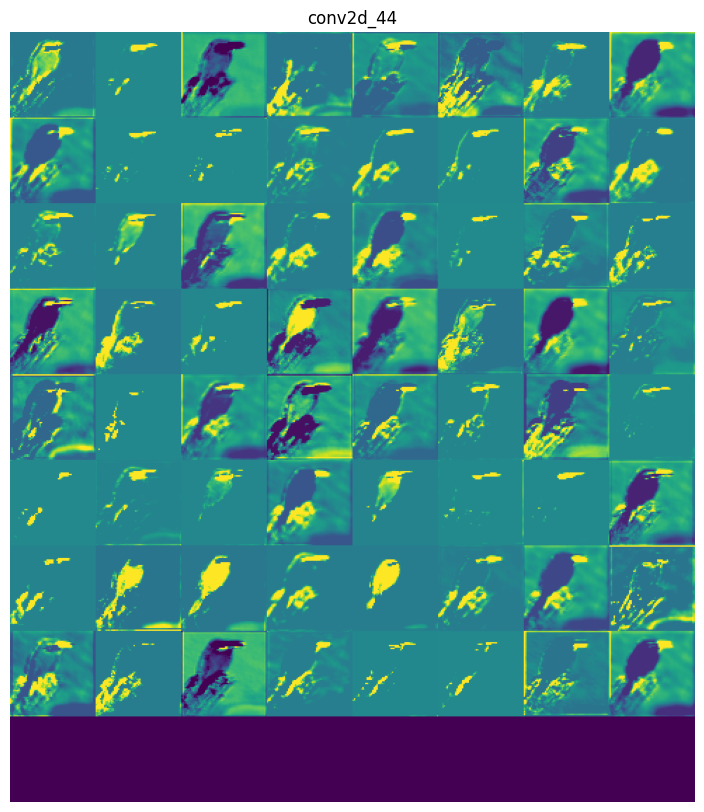

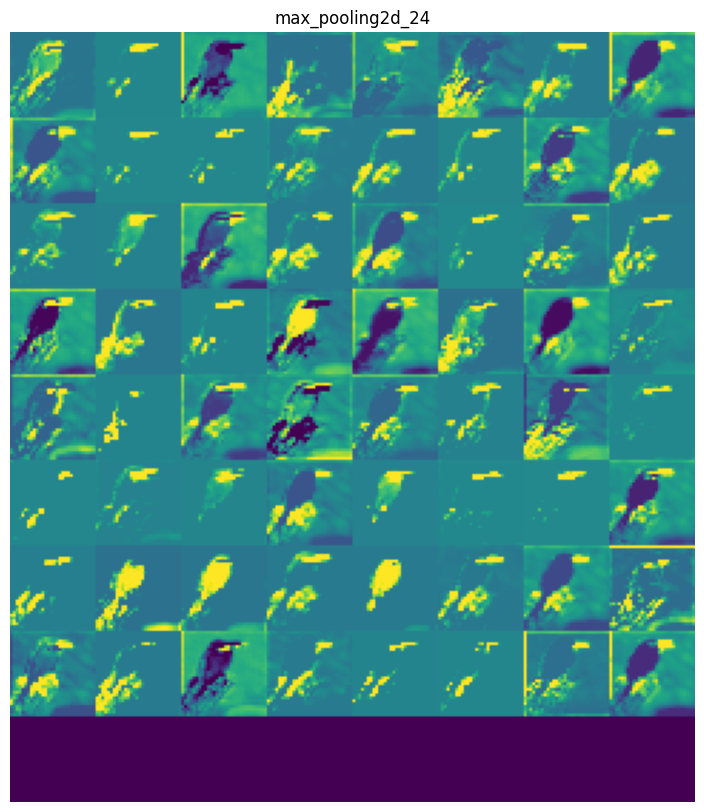

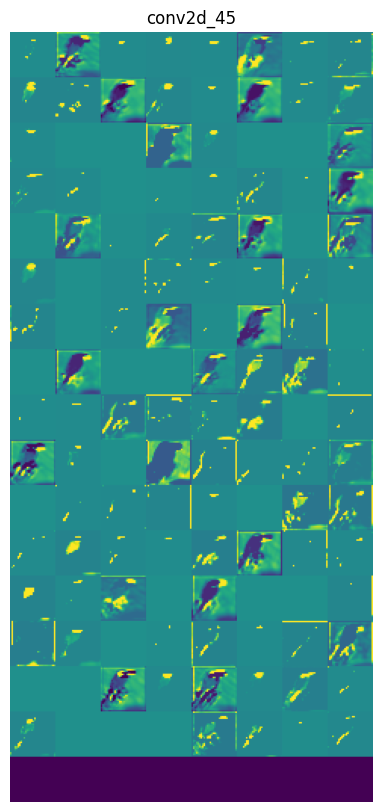

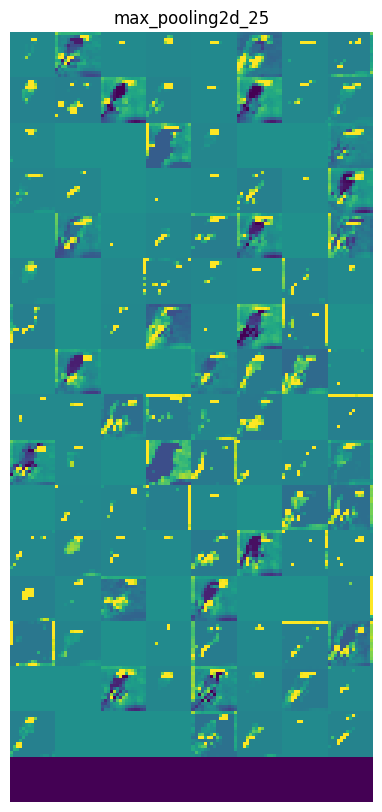


=== Class 1 ===


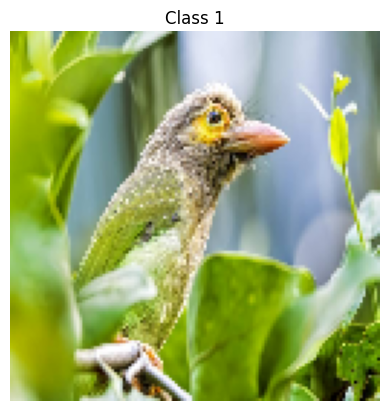

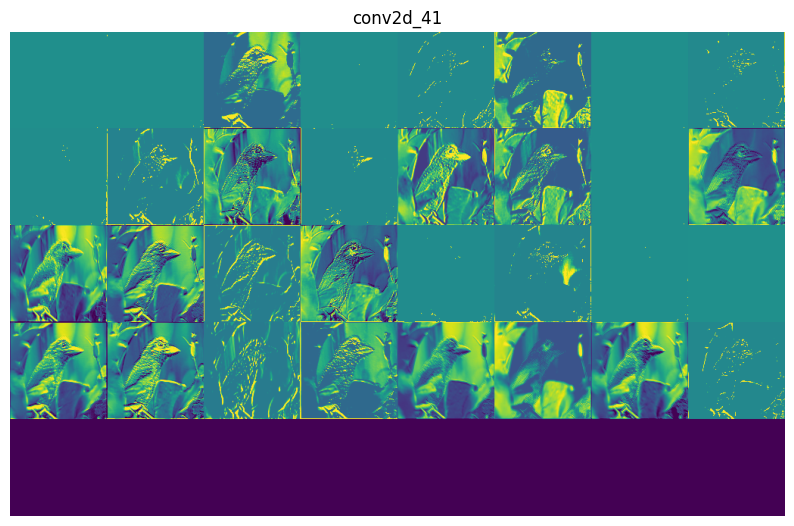

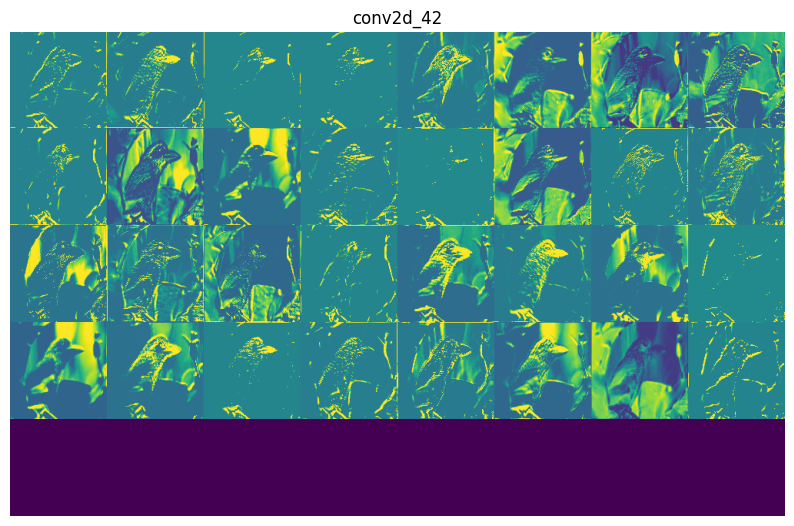

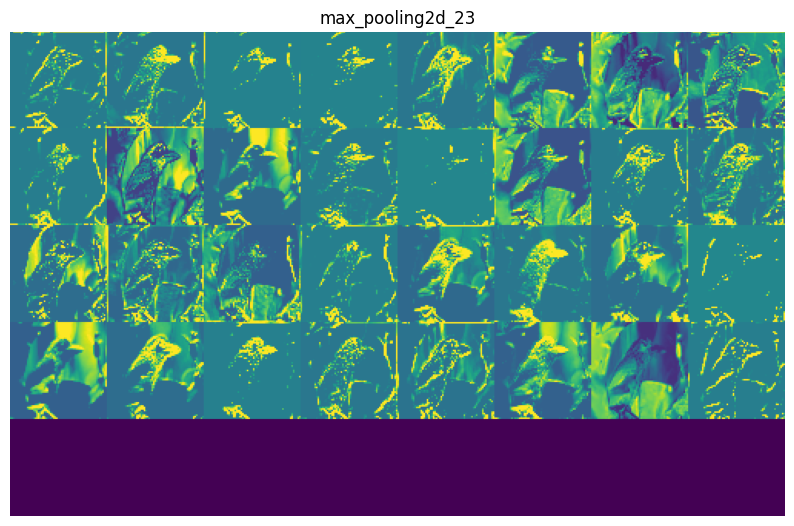

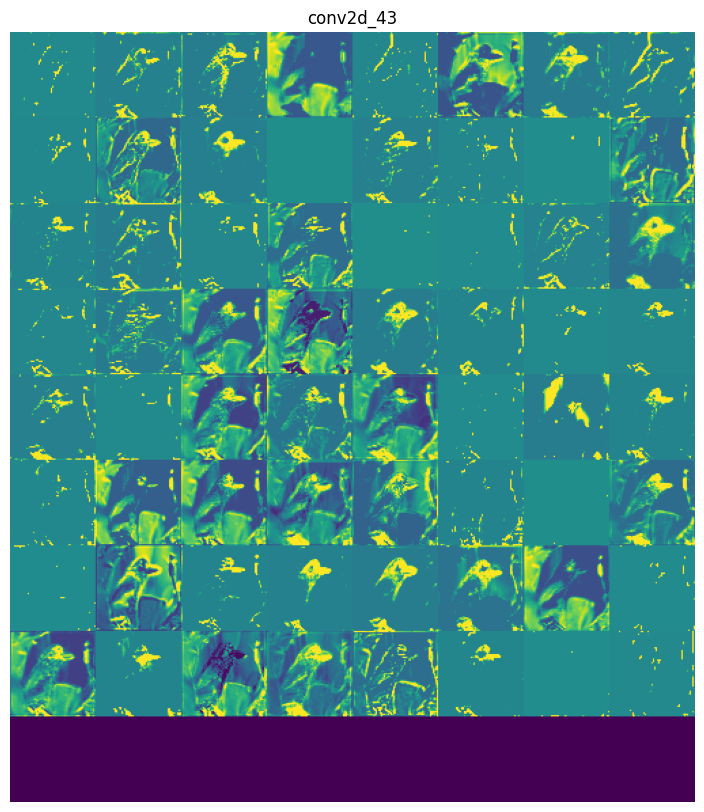

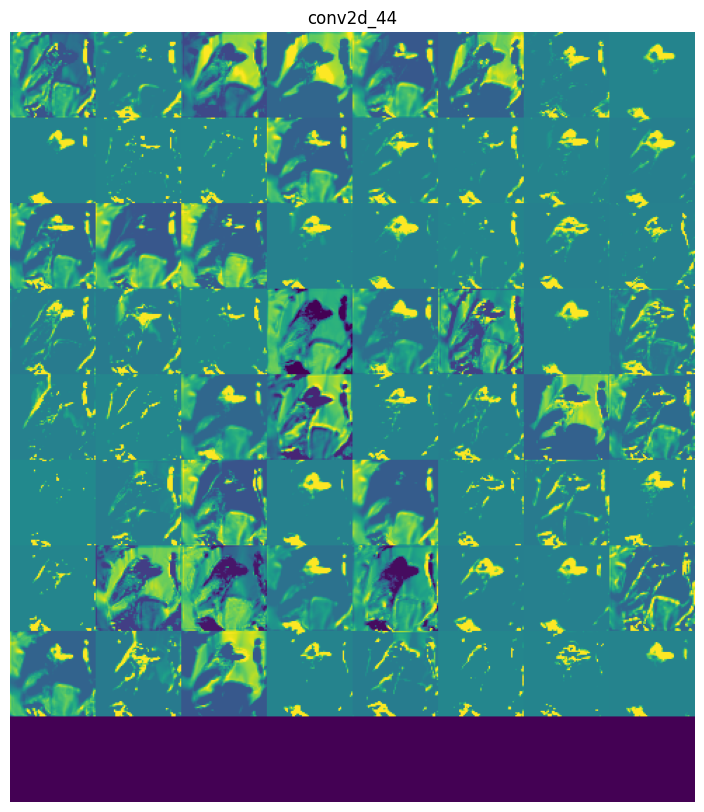

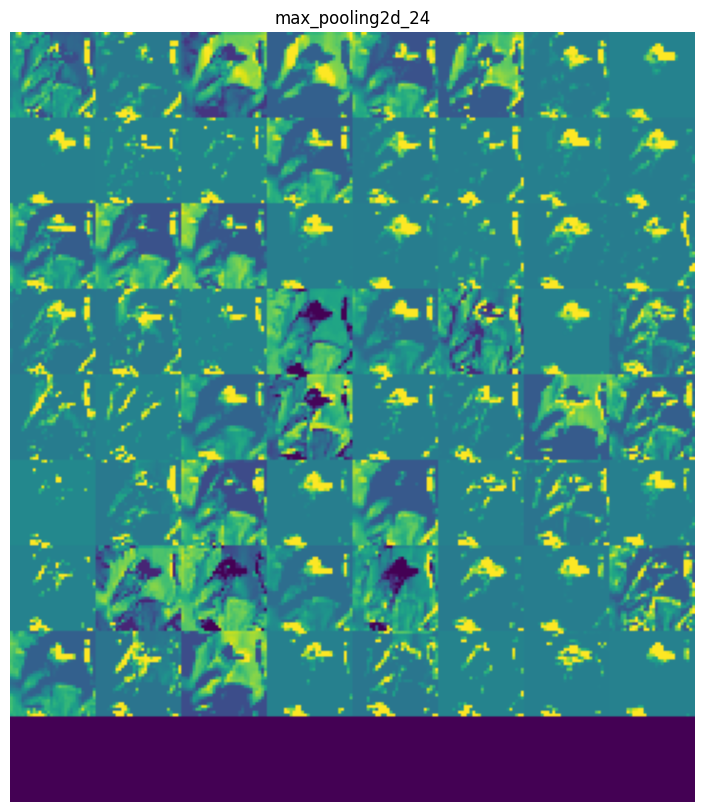

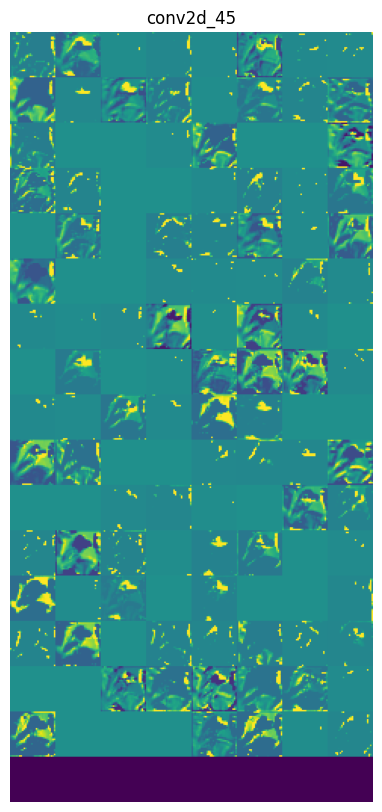

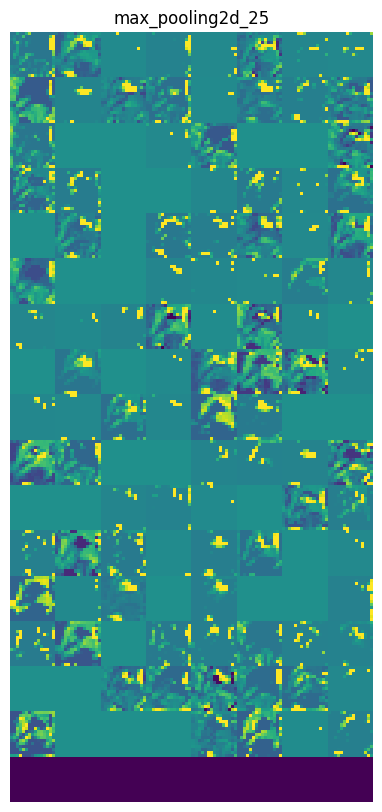


=== Class 2 ===


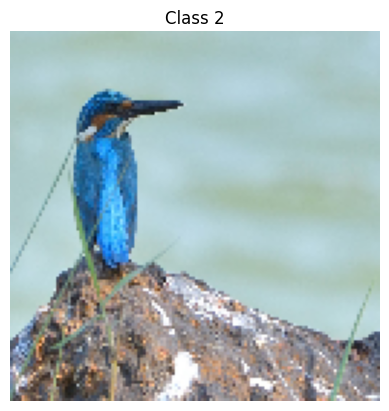

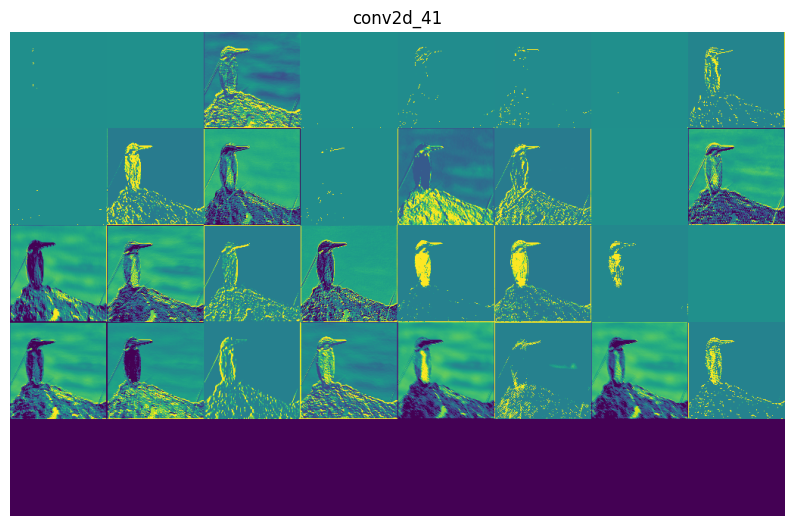

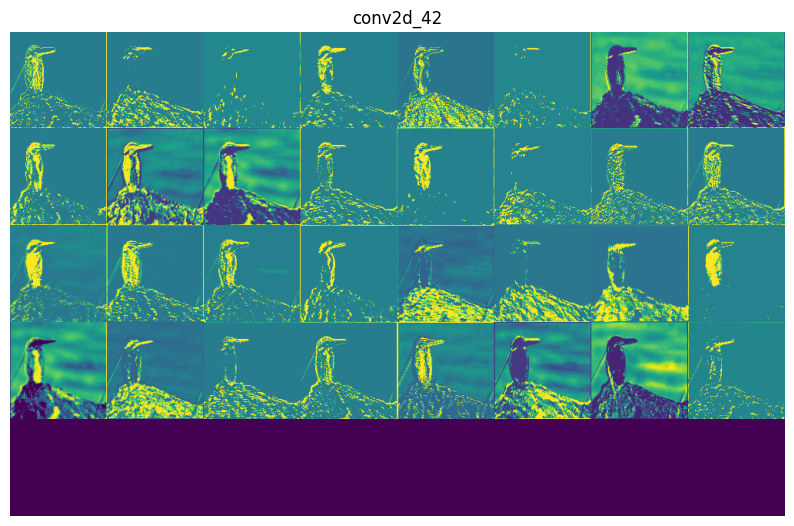

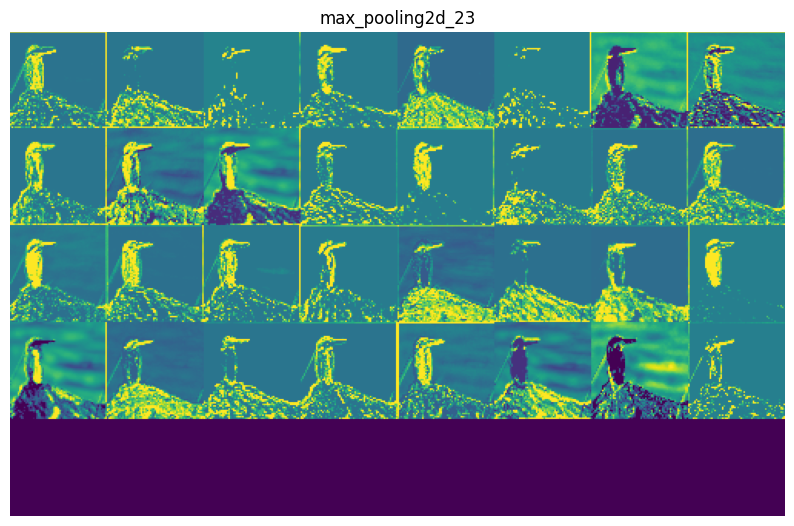

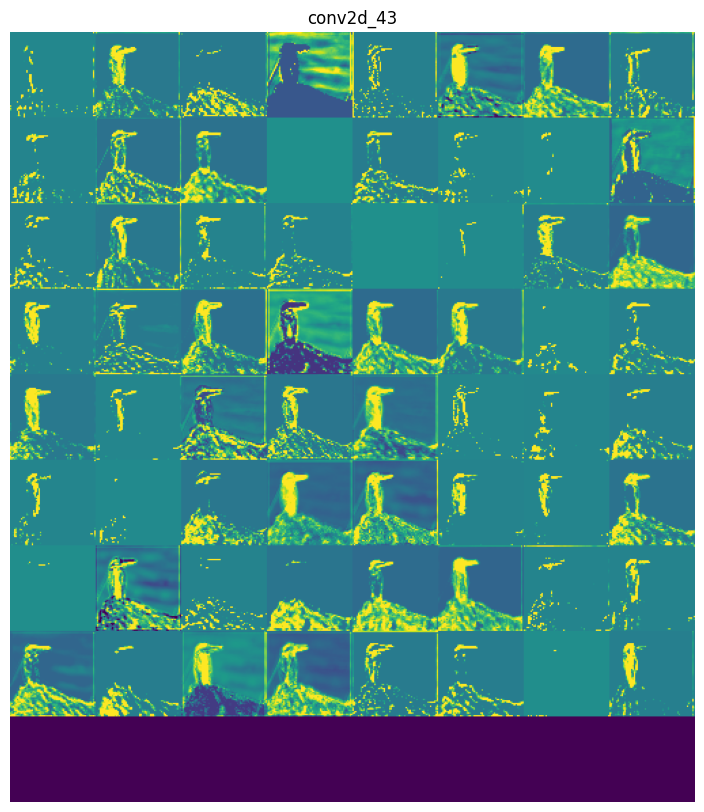

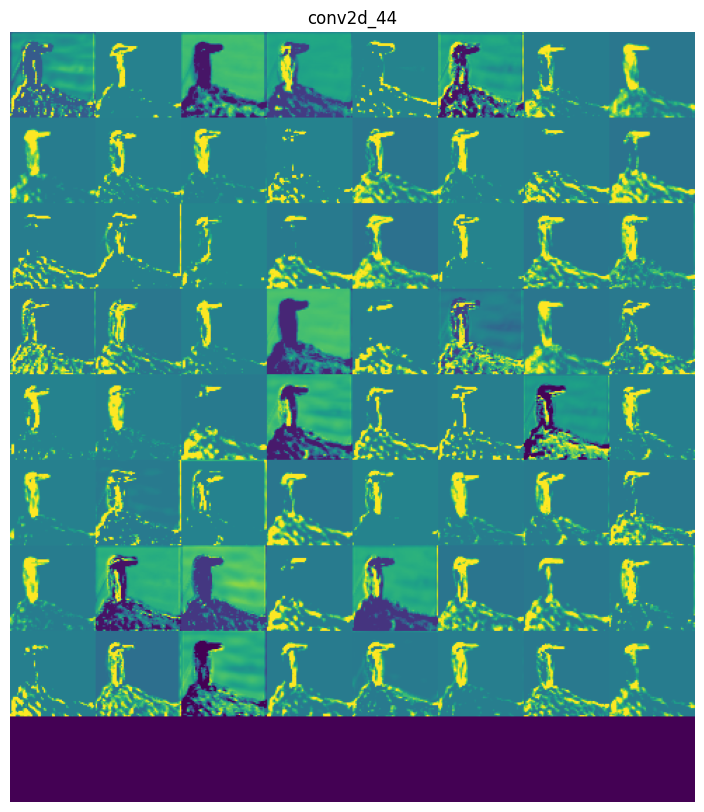

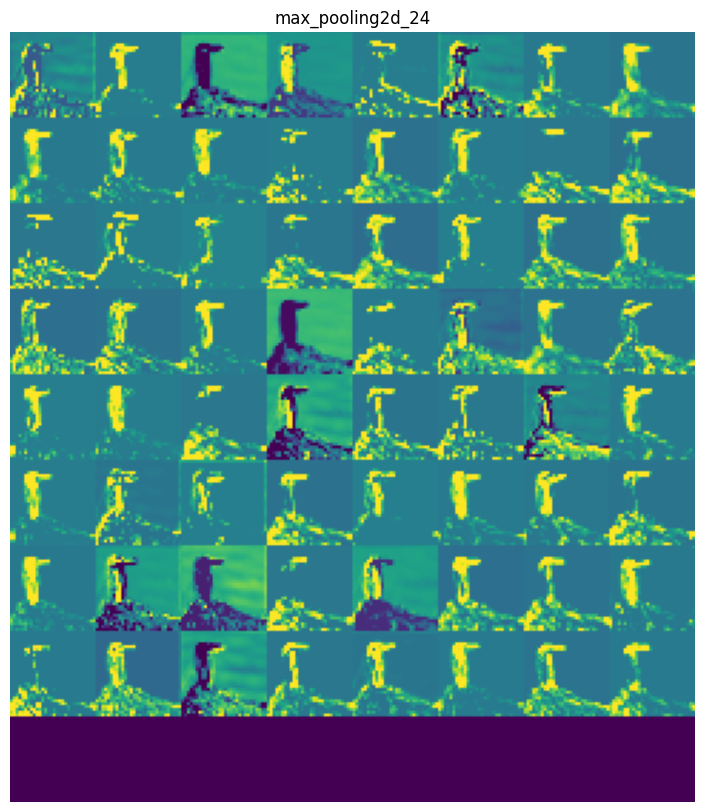

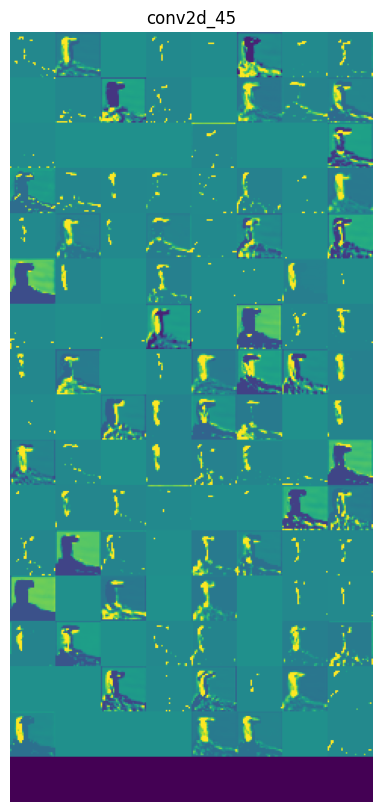

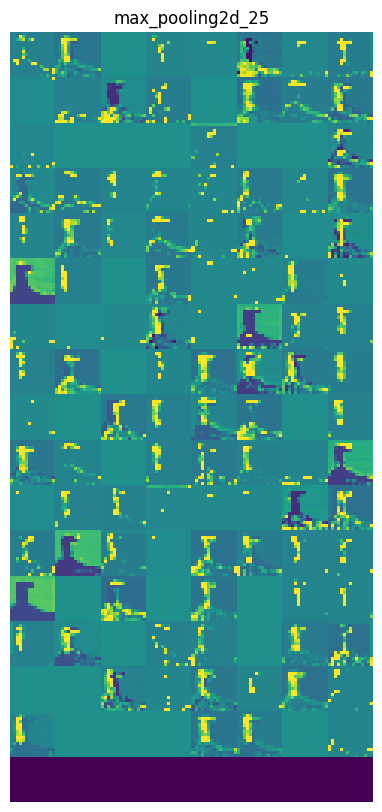

In [44]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping

# загрузка датасета
DATASET_PATH = '/content/drive/MyDrive/ПР-3/Dataset'
IMG_SIZE = 128

images = []
labels = []

classes = sorted(os.listdir(DATASET_PATH))
print(f"Классы: {classes}")

for label, cls in enumerate(classes):
    cls_path = os.path.join(DATASET_PATH, cls)

    if not os.path.isdir(cls_path):
        continue

    for file in os.listdir(cls_path):
        img_path = os.path.join(cls_path, file)

        img = cv2.imread(img_path)
        if img is None:
            continue

        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        images.append(img)
        labels.append(label)

X = np.array(images, dtype='float32') / 255.0
y = np.array(labels)

# разделение на обучающую и тестовую выборки
x_train, x_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print("Train:", x_train.shape)
print("Test:", x_test.shape)

# модель
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping

model = Sequential([
    Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    BatchNormalization(),
    Conv2D(32, (3,3), activation='relu'),
    MaxPooling2D(),
    Dropout(0.2),

    Conv2D(64, (3,3), padding='same', activation='relu'),
    BatchNormalization(),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(),
    Dropout(0.3),

    Conv2D(128, (3,3), padding='same', activation='relu'),
    BatchNormalization(),
    MaxPooling2D(),
    Dropout(0.3),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.4),

    Dense(len(classes), activation='softmax')
])

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

# обучение
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True
)

history = model.fit(
    x_train, y_train,
    validation_data=(x_test, y_test),
    epochs=50,   # ❗ 1000 не нужно
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)

# графики
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Accuracy')
plt.legend()
plt.grid()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Loss')
plt.legend()
plt.grid()

plt.show()

# Визуализация активаций
def visualize_act_map(model, img):

    target_types = (tf.keras.layers.Conv2D,
                    tf.keras.layers.MaxPooling2D)

    x = np.expand_dims(img, axis=0)

    for layer in model.layers:
        x = layer(x)

        if isinstance(layer, target_types):
            activation = x.numpy()
            n_features = activation.shape[-1]
            size = activation.shape[1]

            n_cols = n_features // 8 + 1
            display_grid = np.zeros((size * n_cols, size * 8))

            for col in range(n_cols):
                for row in range(8):
                    idx = col * 8 + row
                    if idx >= n_features:
                        continue

                    channel = activation[0, :, :, idx]
                    channel -= channel.mean()
                    if channel.std() != 0:
                        channel /= channel.std()
                    channel *= 64
                    channel += 128
                    channel = np.clip(channel, 0, 255)

                    display_grid[
                        col*size:(col+1)*size,
                        row*size:(row+1)*size
                    ] = channel

            plt.figure(figsize=(10,10))
            plt.title(layer.name)
            plt.imshow(display_grid, cmap='viridis')
            plt.axis('off')
            plt.show()

unique_classes = np.unique(y_train)
classes_vis = unique_classes[:3]

for cls in classes_vis:
    idx = np.where(y_train == cls)[0][0]
    img = x_train[idx]

    print(f"\n=== Class {cls} ===")

    plt.imshow(img)
    plt.title(f'Class {cls}')
    plt.axis('off')
    plt.show()

    visualize_act_map(model, img)

Модель с BatchNorm и Dropout показала более высокую точность на валидационной выборке 93–94% по сравнению с обычной моделью 91%. Это говорит о лучшей обобщающей способности.

Использование BatchNorm для ускорения обучения и Dropout для снижения переобучения потверждает свою эффективность.